# **Deep Learning Homework 6: *Variational Autoencoders***
### MSc Computer Science, Data Science, Cybersecurity Computer Engeneering @UniPD
### 2nd semester - 6 ECTS
### Prof. Nicolò Navarin & Prof. Alessandro Sperduti
---

In this homework, we will explore how to develop a Variational Autoencoder (VAE). As a dataset, we will use the MNIST dataset. In developing the VAE we also explore how to develop an ad-hoc layer and a custom training step.

**NOTE**: in order to run this notebook without problems, please connect to a *GPU runtime*. You can do so by clicking on the RAM / Disk icon in the upper right part of the notebook, then on *Change runtime tipe* at the bottom of the page, and then select the GPU hardware accelerator.


### Load Dataset
We load the MNIST dataset, using `tf.keras.datasets`. The dataset contains 60,000 training grayscale images and 10,000 testing image of handwritten digits.

In [1]:
# load necessary libriaries and functions
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

def plot_loss(history):
  plt.figure(figsize=(10,6))
  plt.subplot(1, 2, 1)
  plt.plot(history.epoch,history.history['reconstruction_loss'])
  plt.title('reconstruction_loss')
  plt.subplot(1, 2, 2)
  plt.plot(history.epoch,history.history['kl_loss'])
  plt.title('kl_loss')
  plt.show()

In [2]:
(x_train_full, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# Rescale the pixel values
x_train_full = x_train_full.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# Flatten the arrays
x_train = x_train_full.reshape((len(x_train_full), np.prod(x_train_full.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))

# In this HW, we will not need a validation set since we will not deal with model selection
# x_valid, y_valid = x_train[:10000], y_train[:10000]
# x_train, y_train = x_train[10000:], y_train[10000:]

11490434/11490434 [==============================] - 0s 0us/step


##[TO COMPLETE] Exercise 6.1: Variational Autoencoder: reparameterization trick
To implement a VAE we have to define 2 main parts: the _Encoder_ and the _Decoder_.
Let's start by the Encoder, that computes an encoding of the input from which it computes the mean and the average of the sample distribution.
Once we have these two statistics, we have to implement the sampling phase. Keras does not provide any predefined method to perform this operation, therefore we have to define it. With the aim to be consistent with the layer-composition paradigm used by Keras in defining a model, we define a Sampling layer as a new layer.

To do this we define a new class that inherits from the layer base class `tf.keras.layers` that is used as base class for all the layers defined in Keras. In more detail, from this class we are interested in overriding the *call* method, that is the one that is called when a layer is exploited by the model, and where the operations executed by the layer are defined.

In our case, the Sampling layer has in input the tuple made of the mean and the log-variance, and it has to compute the sample $z$ from them by exploiting the reparameterization trick:
$$
z=z_{mean} + exp(z_{var}/2) * \epsilon
$$
The reparameterization trick is used in VAE because it actually helps in the backpropagation process. Specifically, $\epsilon \sim \mathcal{N}(0,1)$ actually reparameterizes our VAE network. This allows the mean and log-variance vectors to still remain as the learnable parameters of the network while  maintaining the stochasticity of the entire system via epsilon.

**[TO COMPLETE]**: complete the code defining the Sampling layer that implements the reparametrization trick.

**Hint**: to generate random values from a normal distribution you can use the keras [tf.keras.backend.random_normal](https://www.tensorflow.org/api_docs/python/tf/keras/backend/random_normal) method, and make sure the output shape is the proper one.


In [3]:
class Sampling(tf.keras.layers.Layer):
   
    def call(self, inputs):
        #[TO COMPLETE] compute and return z
        z_mean, z_var = inputs
        eps = tf.keras.backend.random_normal(tf.shape(z_mean))
        return z_mean + tf.exp(z_var/2) * eps

##[TO COMPLETE] Exercise 6.2: Encoder
Now we can define the Encoder. Let's use $n$ dense layers (similarly to what we did in HW5, with a funnel-like architecture), and then use the obtained encoding to compute `z_mean` and `z_var`, by using two different dense layers. Finally, we use the Sampling layer to compute the sample $z$. Note that we define the `latent_dim` (that is the dimension of $z$) to $2$. This choice is made to make possible to represent the results graphically.

**[TO COMPLETE]**: complete the code defining a deep encoder and the Dense layers that model `z_mean` and `z_var`. Explain your choice for what concerns the number of layers, the layers sizes and the activation functions. Insert motivations about your choice into the tex cell below.

In [4]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x_1 = tf.keras.layers.Dense(392, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(encoder_inputs) #INPUT_DIM/2
x_2 = tf.keras.layers.Dense(196, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(x_1) #INPUT_DIM/4
x_3 = tf.keras.layers.Dense(98, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(x_2) #INPUT_DIM/8
z_mean = tf.keras.layers.Dense(latent_dim, activation='linear')(x_3)
z_var =  tf.keras.layers.Dense(latent_dim, activation='linear')(x_3)
z = Sampling()([z_mean, z_var])
encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 784)]        0           []                               
                                                                                                  
 dense (Dense)                  (None, 392)          307720      ['input_1[0][0]']                
                                                                                                  
 dense_1 (Dense)                (None, 196)          77028       ['dense[0][0]']                  
                                                                                                  
 dense_2 (Dense)                (None, 98)           19306       ['dense_1[0][0]']                
                                                                                            

**Answer:** After some tests i decided to use leaky relu since the relu has the problem of dead neurons and the sigmoid has the problem of vanishing gradient. For the number of node I decided to use decreasing fractions of the input dimension. For the activation funcions of the central layers the linear activation is the one fitting the most the problem since the mean and the log variance range in (-inf,+inf).

##[TO COMPLETE] Exercise 6.3: Decoder
Then we have to define the decoder part. It takes in input $z$ that "decodes" as an image in the input space. The architecture of the decoder should be specular to the encoder architecture, i.e. $n$ layers of the same dimensions of ones in the encoder, but occurring in the reverse order.

**[TO COMPLETE]**: Define the decoder. Explain in this cell your choice for what concerns the number of layers, the layers sizes, and the activation functions (in particular, for what concerns the last layer). Answer in the text cell below. 

In [5]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = tf.keras.layers.Dense(98, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(latent_inputs)
x = tf.keras.layers.Dense(196, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(x)
x = tf.keras.layers.Dense(392, activation=tf.keras.layers.LeakyReLU(alpha=0.2))(x)
decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation='sigmoid')(x) #[TO COMPLETE]


decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_5 (Dense)             (None, 98)                294       
                                                                 
 dense_6 (Dense)             (None, 196)               19404     
                                                                 
 dense_7 (Dense)             (None, 392)               77224     
                                                                 
 dense_8 (Dense)             (None, 784)               308112    
                                                                 
Total params: 405,034
Trainable params: 405,034
Non-trainable params: 0
_________________________________________________________________


**Answer:** It is just the hourglass shape of the autoencoder that imposes the similarity between nodes and the choice of the structure. The last dense layer has a sigmoid activation function since the pixel are described in greyscale with values in [0,1].

##[TO COMPLETE] Exercise 6.4: Training
Now we can define the VAE, but since it is a generative model, we have to define an ad-hoc training phase. Specifically, we have to manage the two losses used for this model. Indeed the parameters of a VAE are trained via two loss functions: a reconstruction loss, that forces the decoded samples to match the initial inputs, and a regularization loss that helps to learn  a well-formed latent space, and to reduce overfitting. The regularization loss is handled with the Kullback-Liebler Divergence. While for the reconstruction loss we are supposed to use the negative log-likelihood. Keras, however, does not support it natively, so to make the exercise simple, we will use as a proxy the binary cross-entropy (`keras.losses.binary_crossentropy`) to compare each feature of a data point to the value in the reconstructed output.

Therefore, we have to define a class that inherits from [keras.model](https://www.tensorflow.org/api_docs/python/tf/keras/Model), and overrides the [training_step method](https://www.tensorflow.org/api_docs/python/tf/keras/Model#train_step), that allows to define a custom training logic.

**[TO COMPLETE]** implement the reconstruction loss and the KL-loss.

In [6]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape: # record operations for automatic differentiation
            z_mean, z_var, z = encoder(data)
            reconstruction = decoder(z)

            reconstruction_loss = tf.reduce_sum(keras.losses.binary_crossentropy(data, reconstruction))
            #from wikipedia inverting the formula of the multivariate normal distribution 
            kl_loss = tf.reduce_mean(0.5*(tf.exp(z_var) - z_var + z_mean**2 - 1)) 

            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights) # optimize the custom loss
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

Let's now train the VAE model using Adam as optimizer.

Epoch 1/30
469/469 [==============================] - 14s 17ms/step - loss: 32.1614 - reconstruction_loss: 30.8472 - kl_loss: 1.3143
Epoch 2/30
469/469 [==============================] - 3s 7ms/step - loss: 28.3366 - reconstruction_loss: 26.6451 - kl_loss: 1.6916
Epoch 3/30
469/469 [==============================] - 2s 4ms/step - loss: 27.5249 - reconstruction_loss: 25.6237 - kl_loss: 1.9012
Epoch 4/30
469/469 [==============================] - 2s 4ms/step - loss: 27.0934 - reconstruction_loss: 25.0800 - kl_loss: 2.0134
Epoch 5/30
469/469 [==============================] - 2s 4ms/step - loss: 26.7948 - reconstruction_loss: 24.6920 - kl_loss: 2.1028
Epoch 6/30
469/469 [==============================] - 2s 4ms/step - loss: 26.5515 - reconstruction_loss: 24.3882 - kl_loss: 2.1632
Epoch 7/30
469/469 [==============================] - 2s 4ms/step - loss: 26.3548 - reconstruction_loss: 24.1331 - kl_loss: 2.2217
Epoch 8/30
469/469 [==============================] - 2s 4ms/step - loss: 26.1934

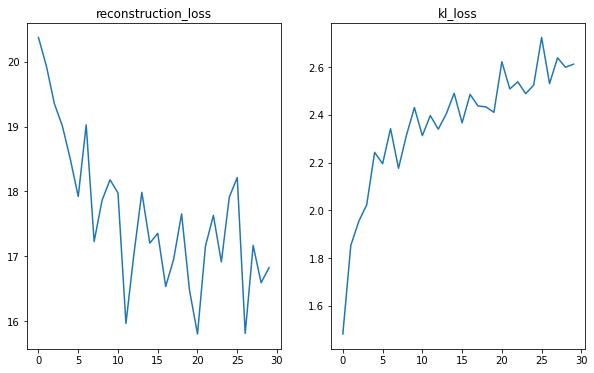

In [7]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
history = vae.fit(x_train, epochs=30, batch_size=128)
plot_loss(history)

##[TO COMPLETE] Exercise 6.5: Model Analysis
Now we can plot an example of the data generation by using the decoder part. Since we used a 2D latent space let's generate sevral possibile 2D $\hat{z}$ samples and pass them to our decoder. With the $scale$ parameter we can define the interval from where the entries of $\hat{z}$ are chosen, and with parameter $n$ it is possibile to define how many samples are generated.  

1/1 - 0s - 79ms/epoch - 79ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 11ms/epoch - 11ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 13ms/epoch - 13ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 16ms/epoch - 16ms/step
1/1 - 0s - 14ms/epoch - 14ms/step
1/1 - 0s - 12ms/epoch - 12ms/step
1/1 - 0s - 16ms/epoch - 16ms/step
1/1 - 0s - 13ms/epoch - 13ms/step
1/1 - 0s - 14ms/epoch - 14ms/step
1/1 - 0s - 13ms/epoch - 13ms/step
1/1 - 0s - 18m

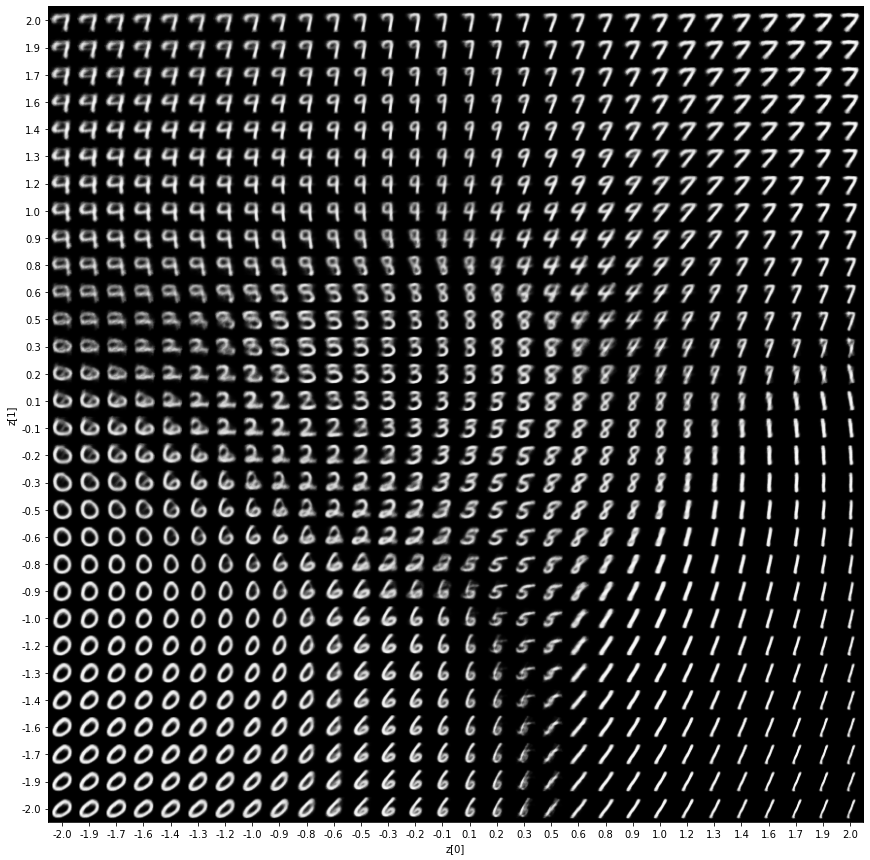

In [8]:
def plot_latent(encoder, decoder, scale=2.0, n = 30, verbose = 2):
     
    digit_size = 28
    figsize = 15
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample, verbose = verbose)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent(encoder, decoder, 2.0, 30) 

#[TO COMPLETE] explore what happens with different "scales"

The final result is quite impressive, considering that all these digits are artificial and they not belong to any dataset!
Let's finally check how the various digits have been represented in the latent space by the VAE.

1875/1875 - 3s - 3s/epoch - 1ms/step


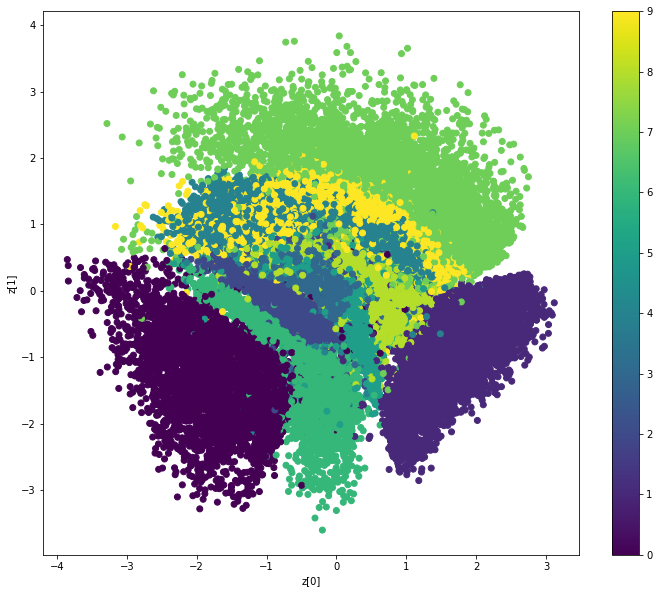

In [9]:
def plot_label_clusters(encoder, decoder, data, labels , verbose = 2):
    z_mean, _, _ = encoder.predict(data , verbose = verbose)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()

plot_label_clusters(encoder, decoder, x_train, y_train)

**[TO COMPLETE]** Discuss the obtained plots, and  explore how the hyper-parameters of the VAE (number of layers, layer sizes, etc.) influence the final result. Insert your discussion into cells immediately below this one.

**Answer:** In the exercise 6.4 we saw the results with scale = 2.0 and n = 30; below I tested what happens changing the scale fixing n = 30 or changing n and fixing scale = 2.0. It is clear from the functions defined before that n and scale are in a kind of inverse relation so we expect that increasing n is like decreasing the scale and viceversa. This is infact what we saw in the plots below. In the first test in which I changed the scale there is a clear problem when the scale is too high: after scale = 4.0 the plots starts to make no sense at all and the numbers created are more and more far from recognizeble. In the second test varying n produced more and more examples, some of them are recognizeble and some of them are a mixture of the neighbours number resulting in a mixture of two or more numbers. As a further analysis could be interesting to pass every generated example to a digit recognition network to see which genereted digit are recognized as numbers and which not (and which correctly!). 

### Testing

#### Testing on different scales

Testing with scale: 1 and n: 30


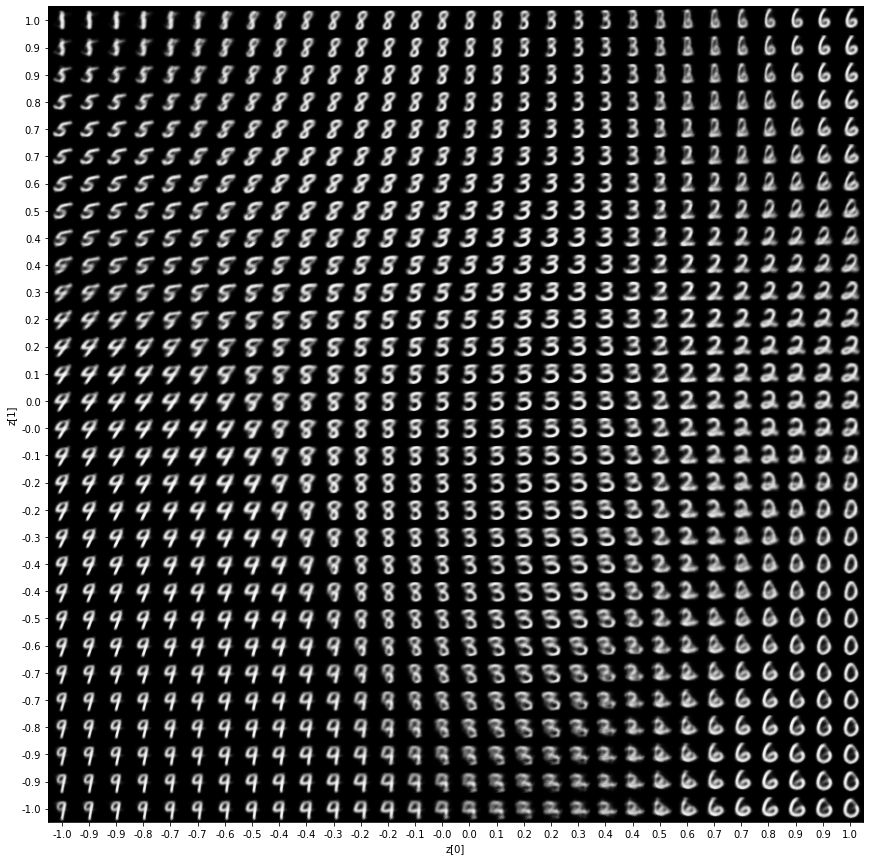

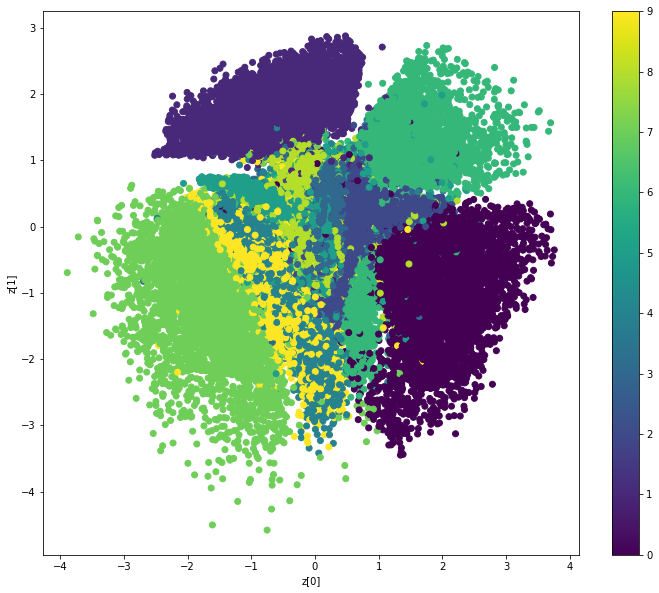

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 30


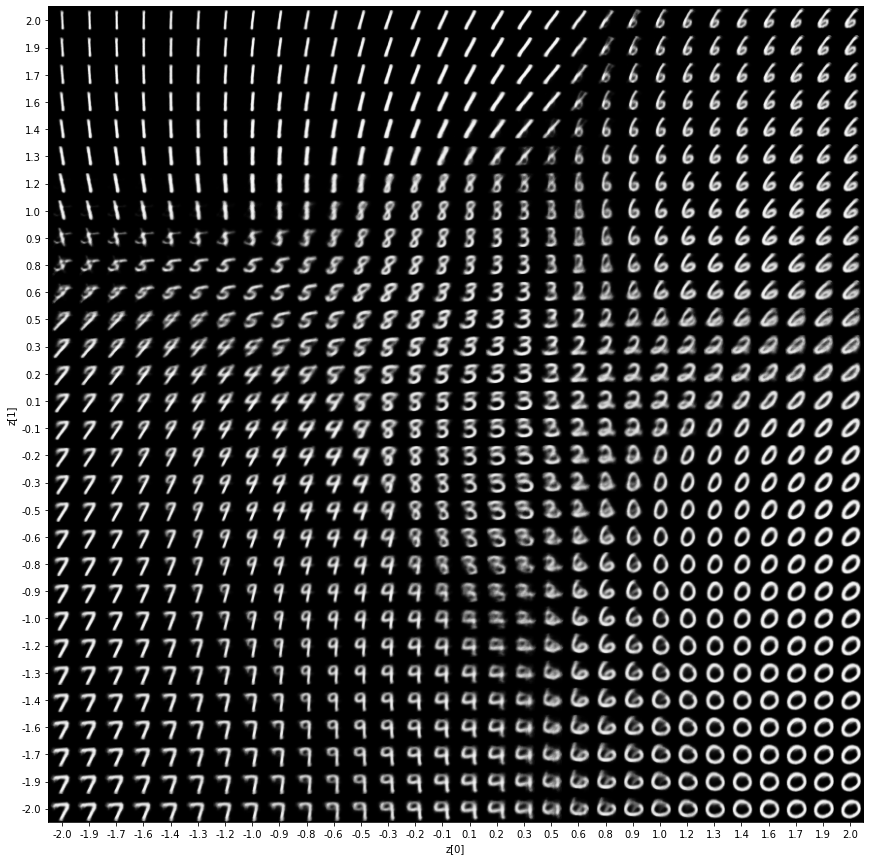

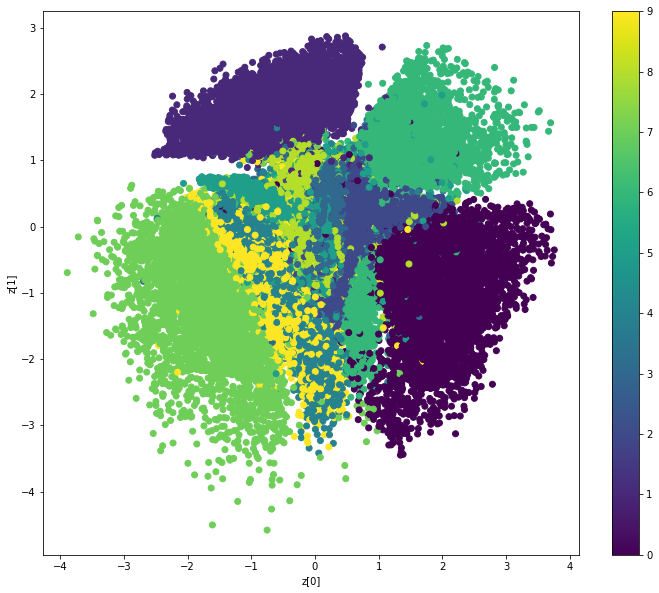

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 3 and n: 30


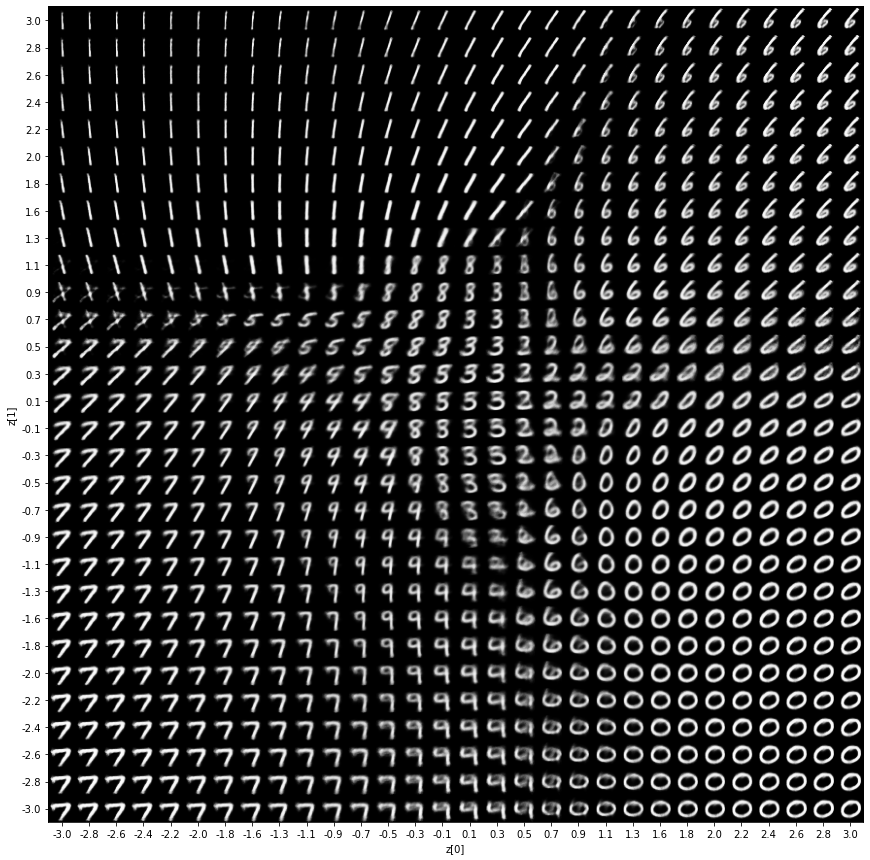

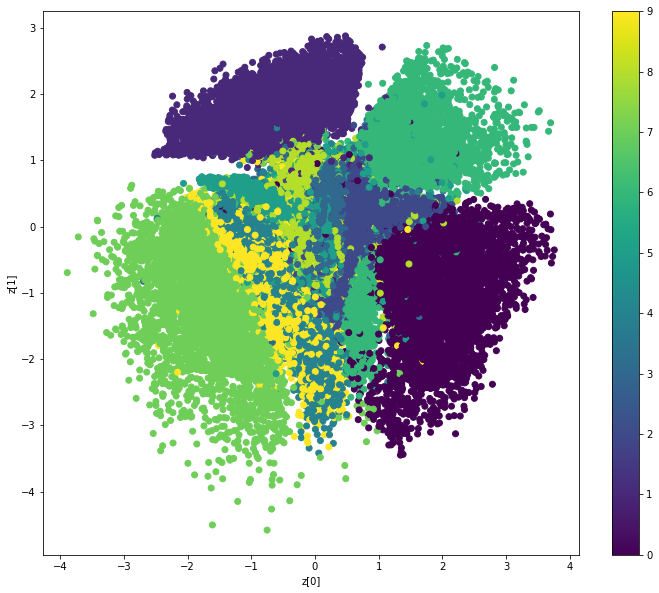

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 4 and n: 30


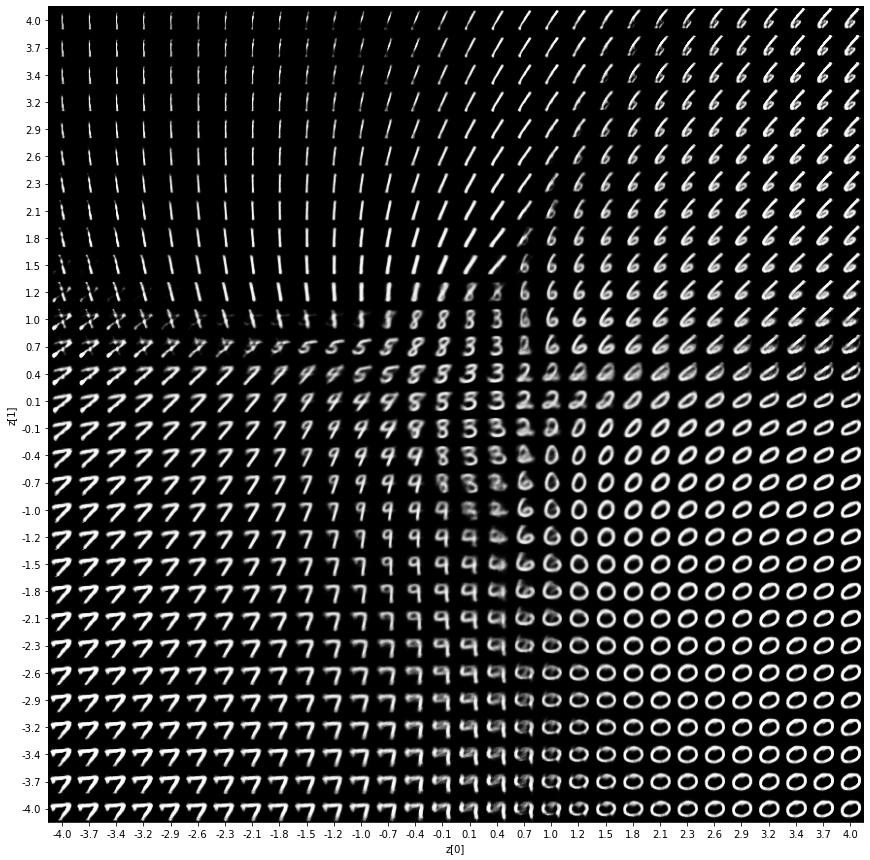

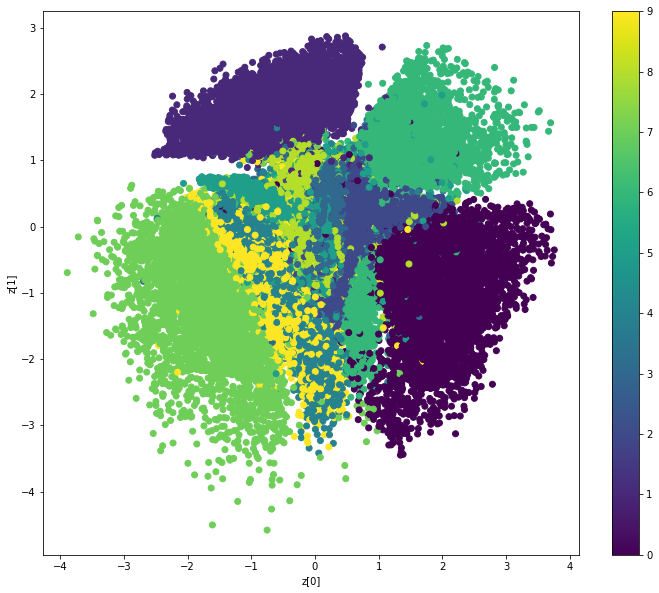

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 5 and n: 30


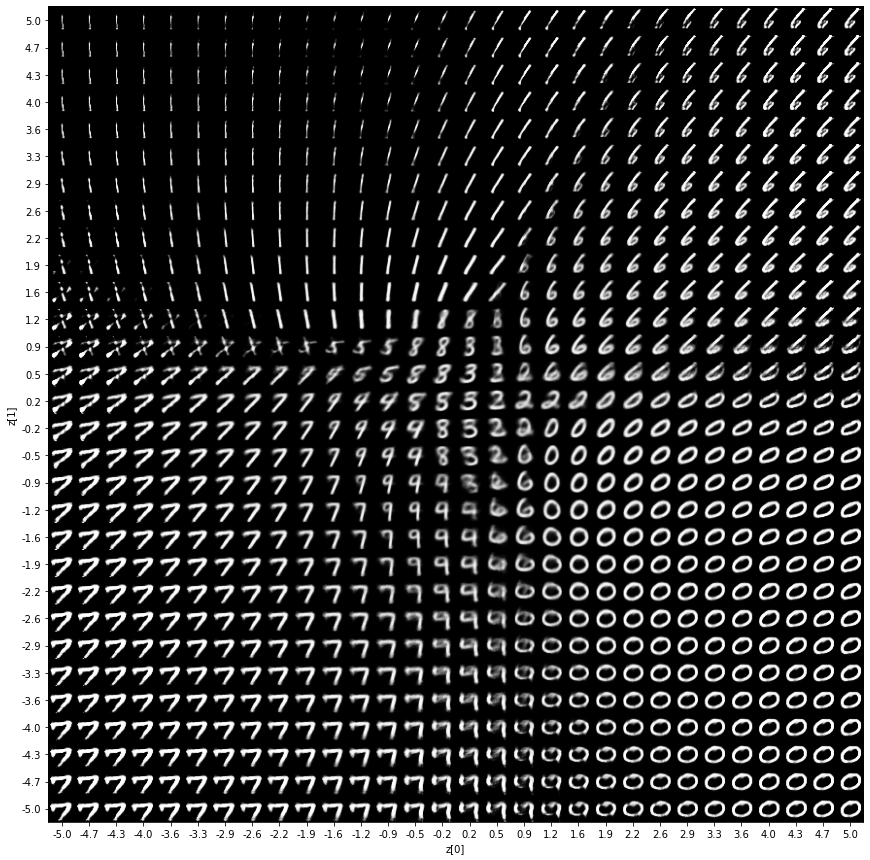

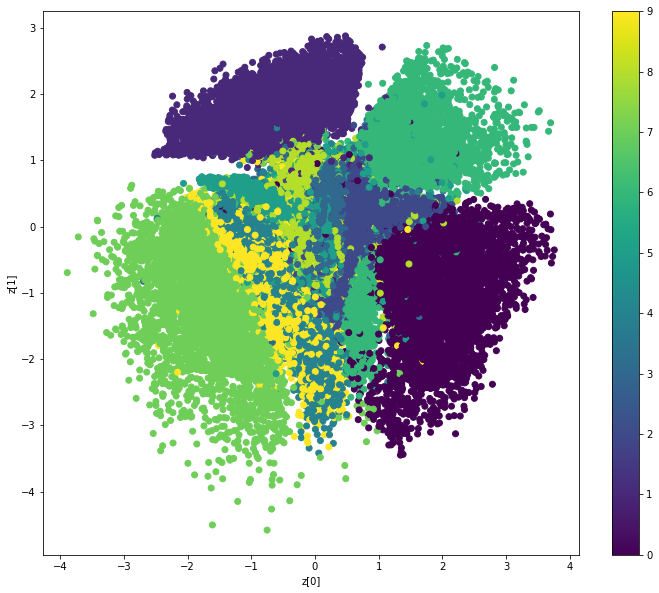

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 6 and n: 30


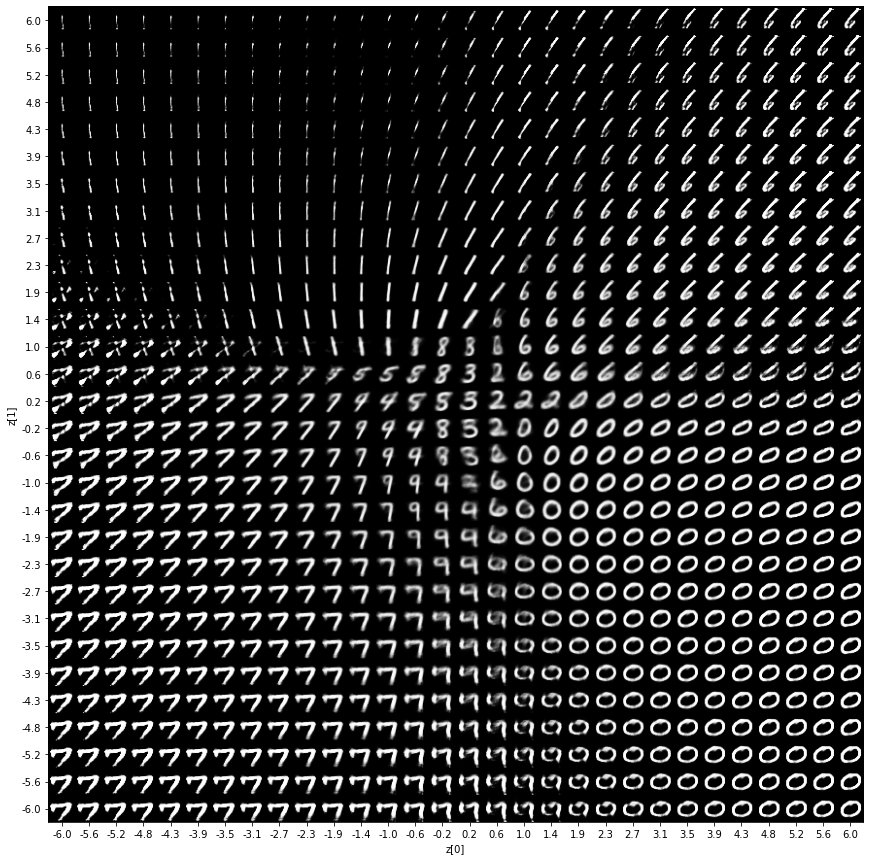

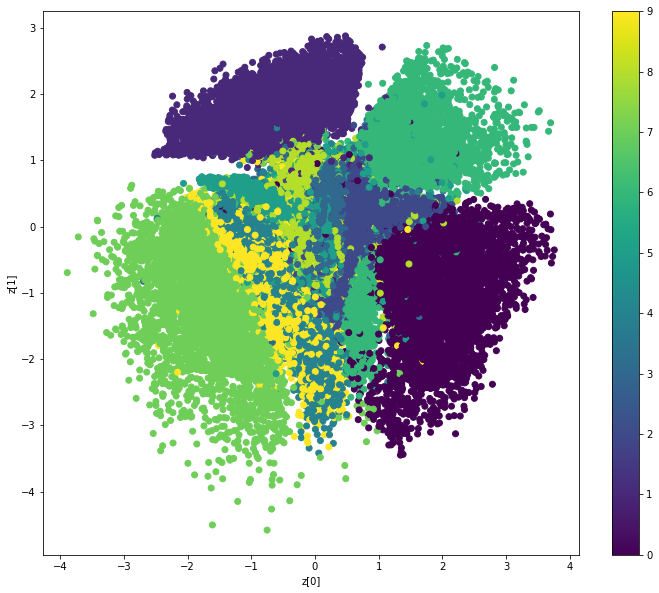

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 7 and n: 30


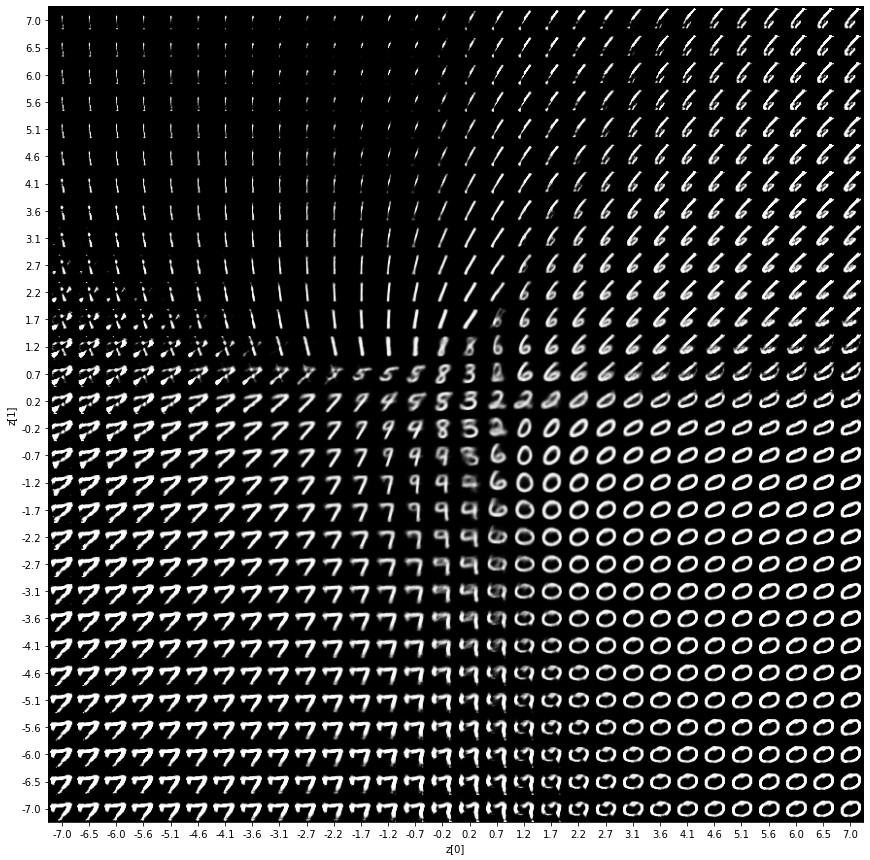

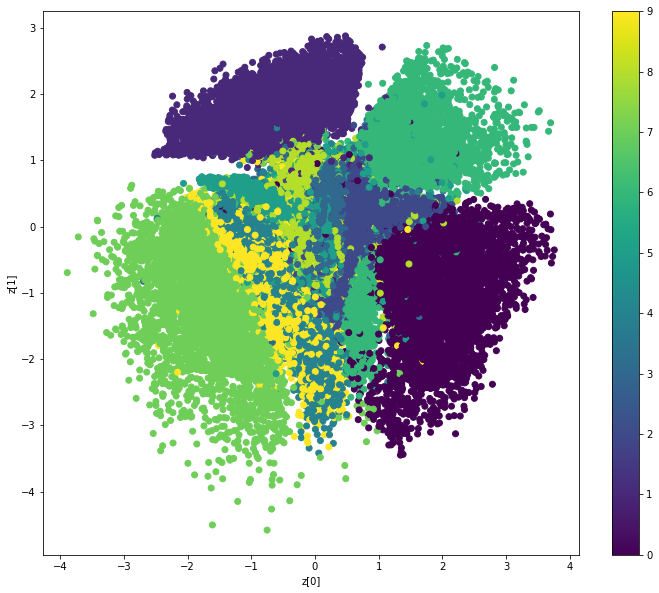

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 8 and n: 30


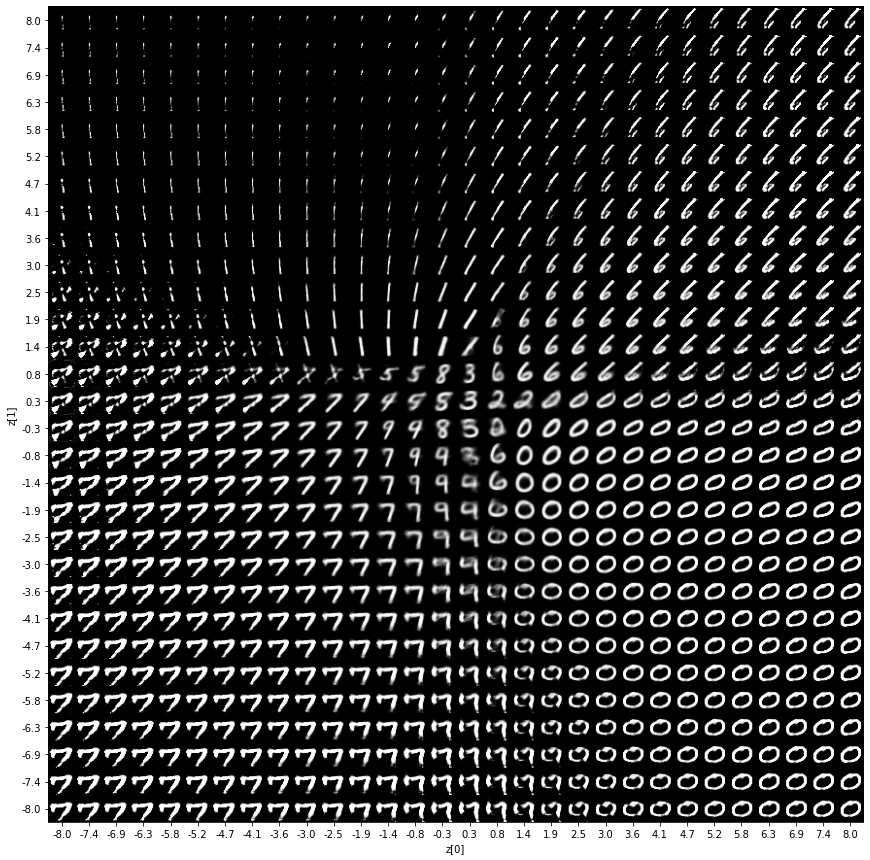

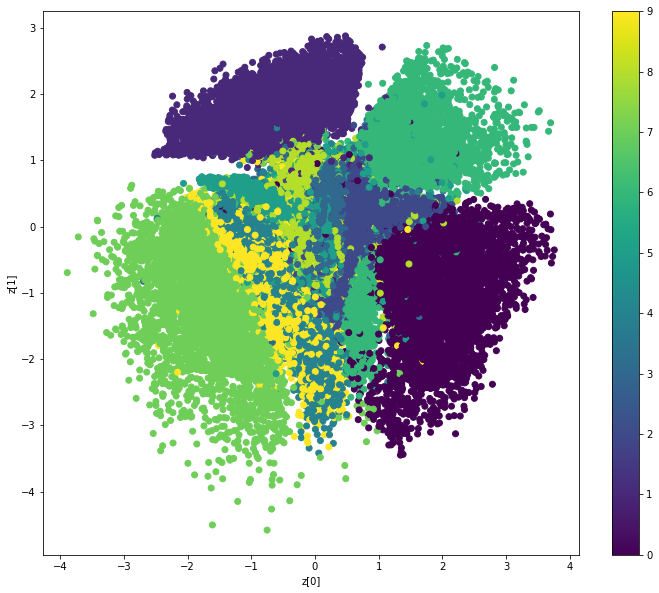

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 9 and n: 30


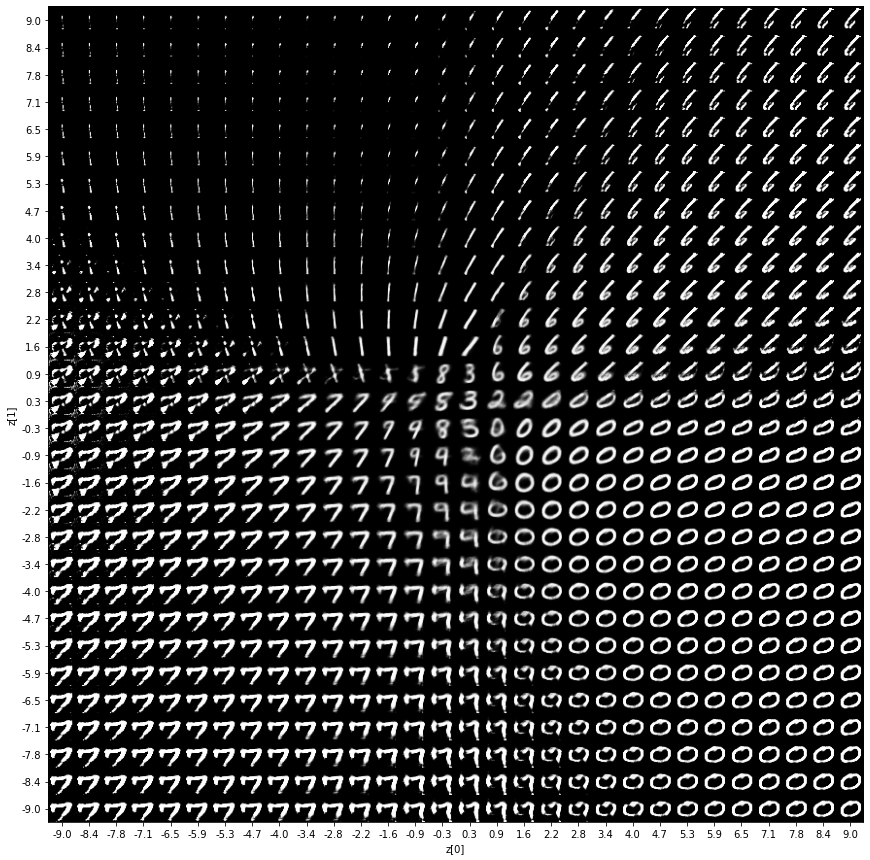

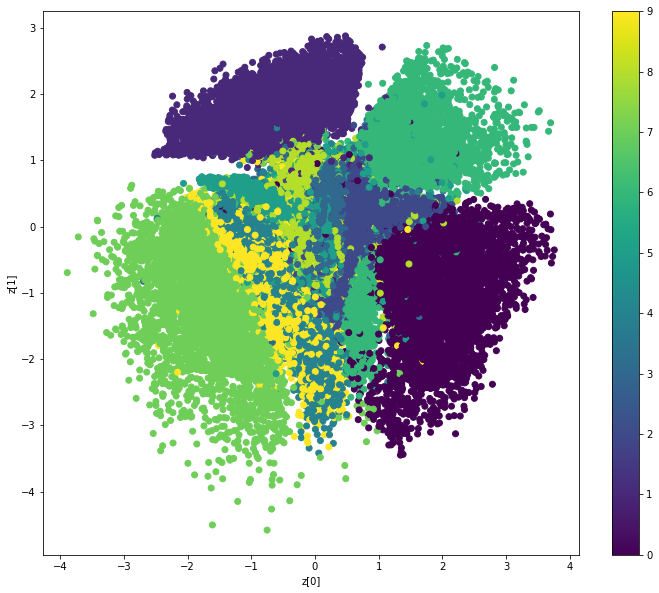

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 10 and n: 30


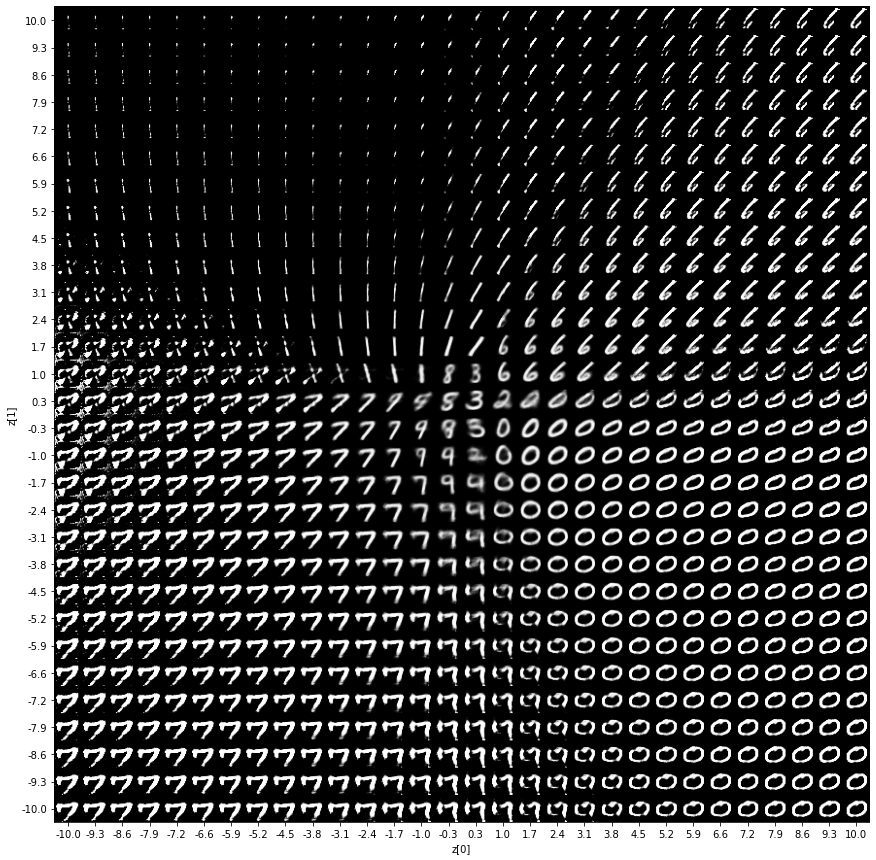

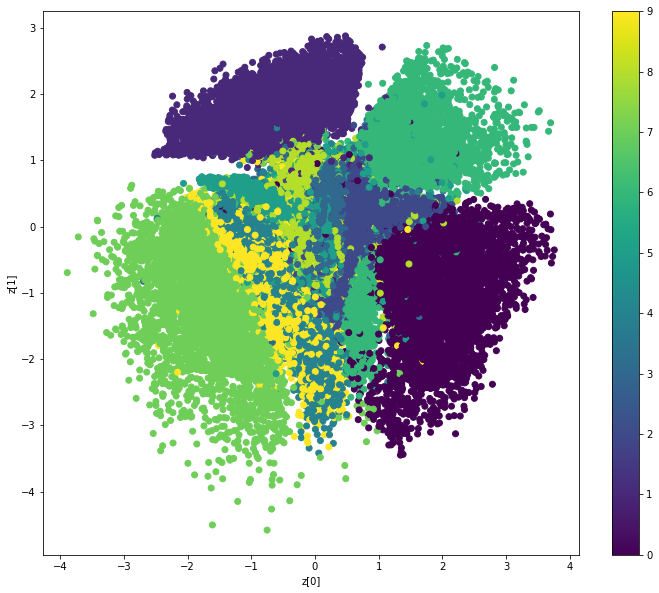

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 100 and n: 30


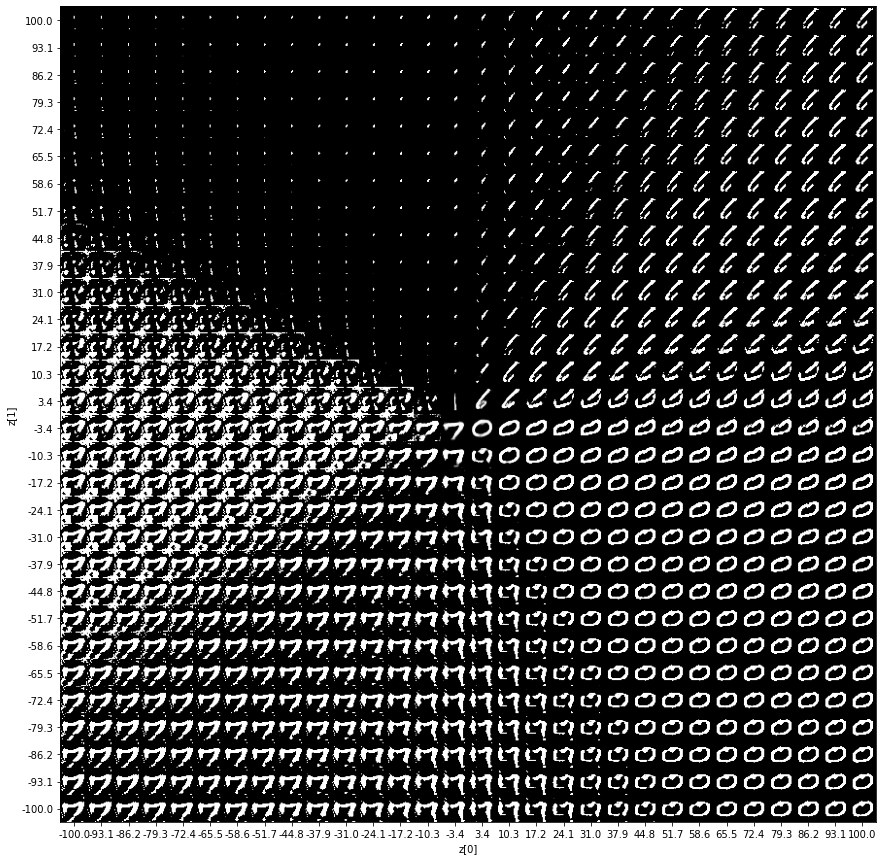

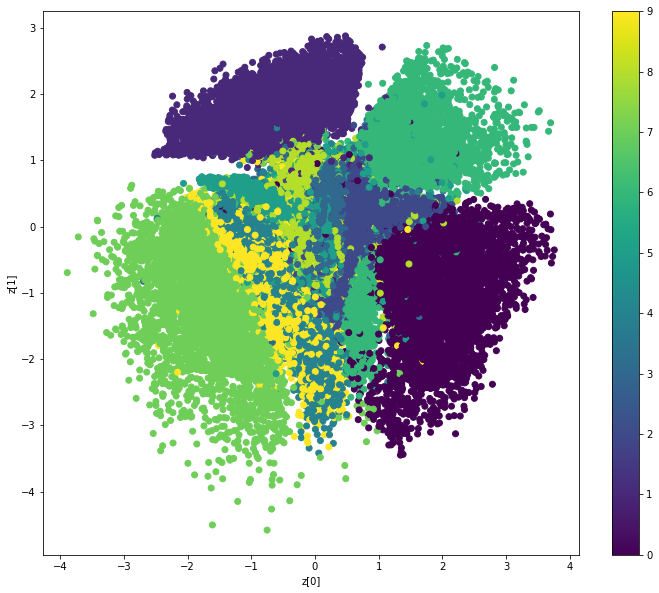

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 1000 and n: 30


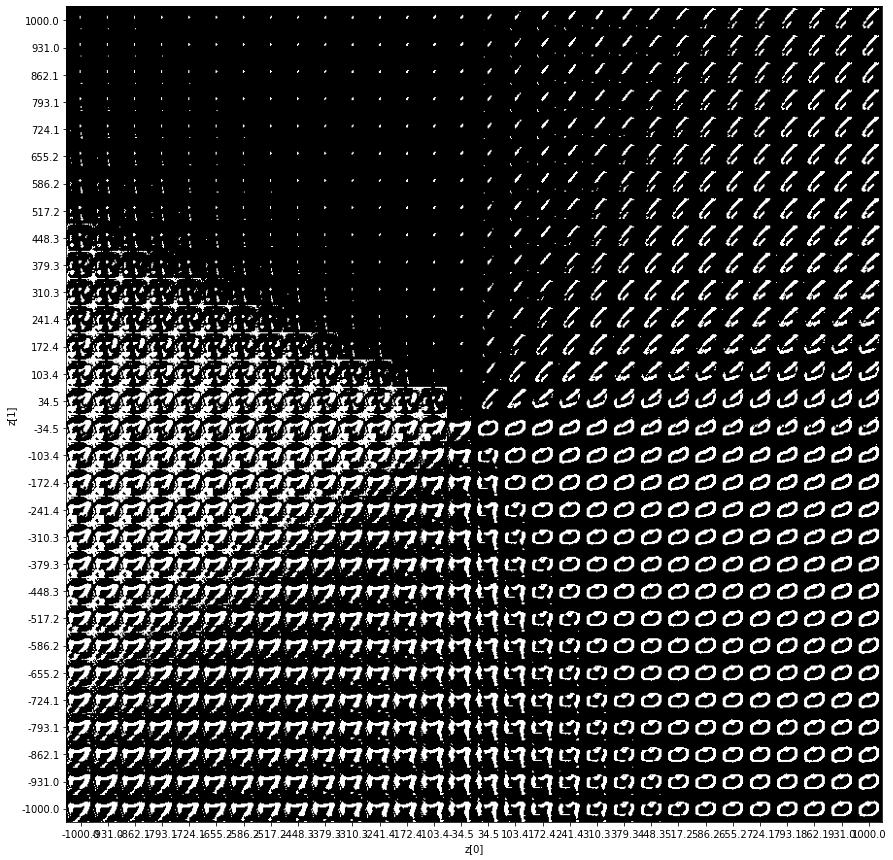

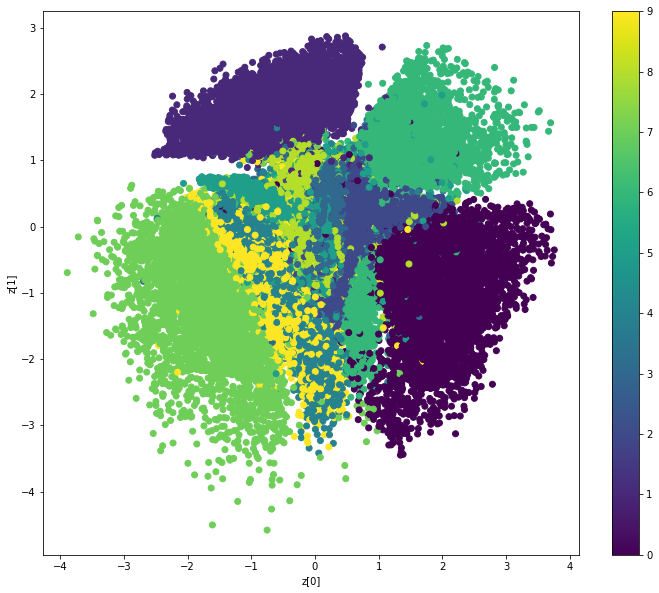

--------------------------------------------------------------------------------------------------------------------------------


In [ ]:
for s in [1,2,3,4,5,6,7,8,9,10,100,1000]:
  print("Testing with scale: {} and n: {}".format(s,30))
  plot_latent(encoder, decoder, scale = s, n = 30, verbose = 0) 
  plot_label_clusters(encoder, decoder, x_train, y_train, verbose = 0)
  print("--------------------------------------------------------------------------------------------------------------------------------")

#### Testing on different n

Testing with scale: 2 and n: 10


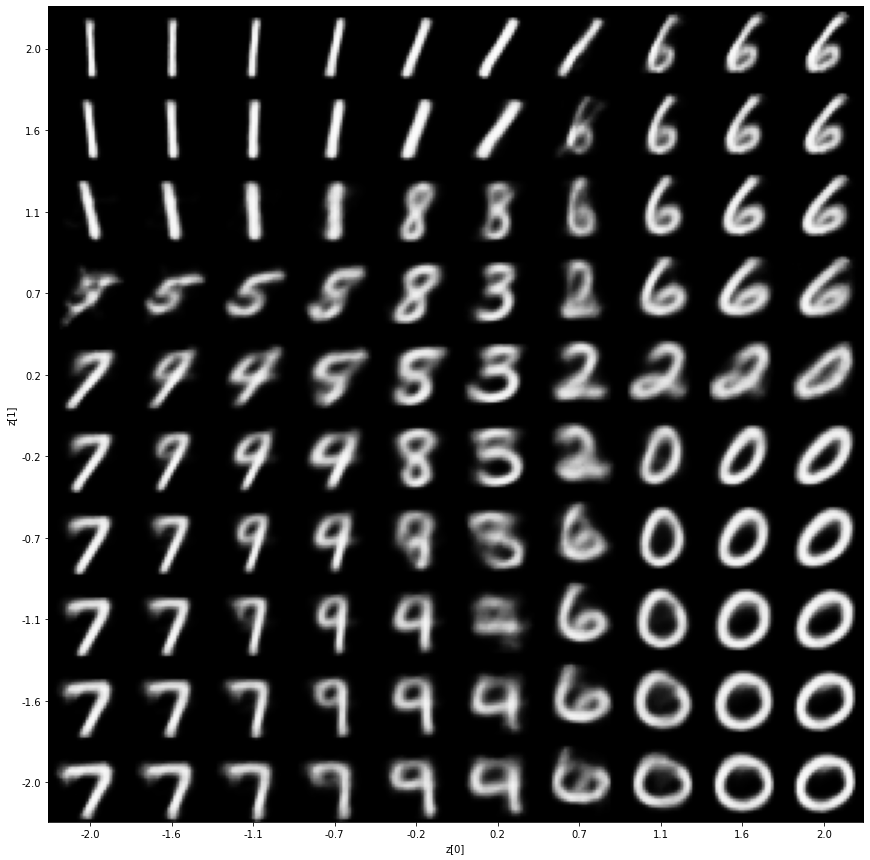

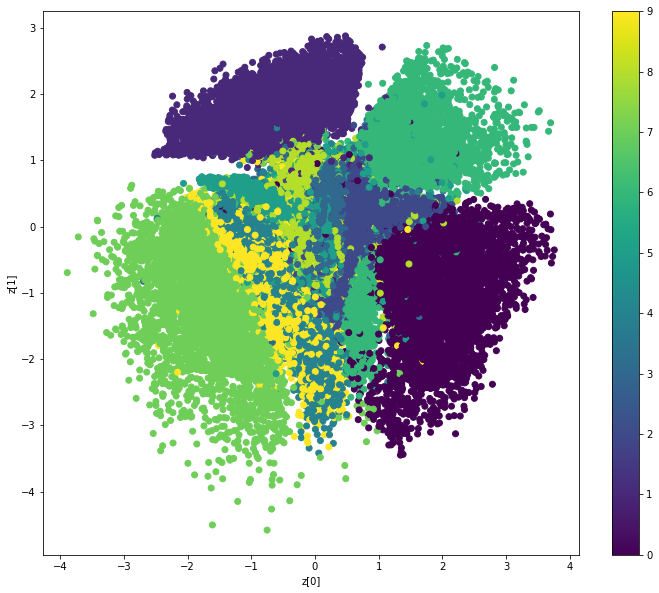

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 20


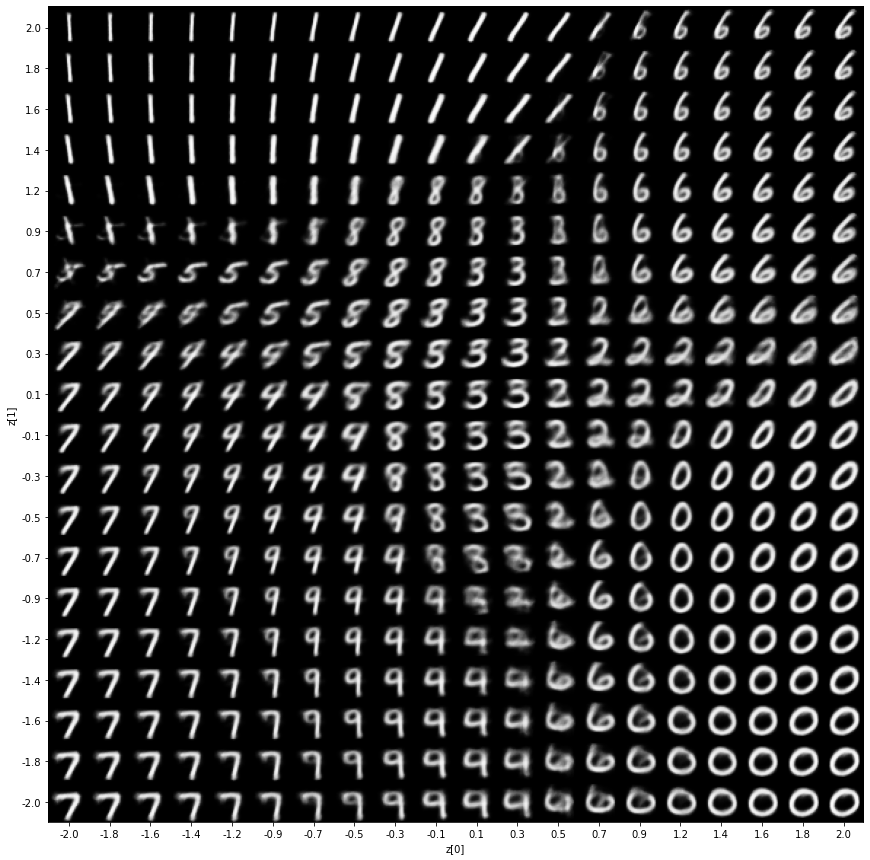

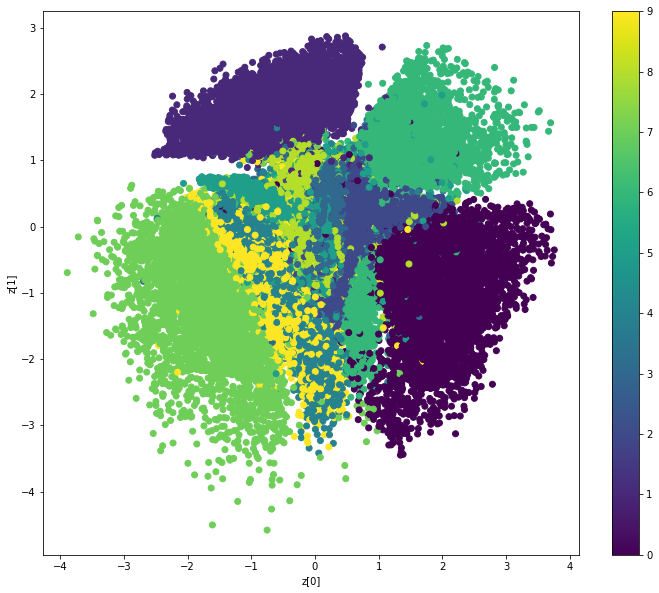

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 30


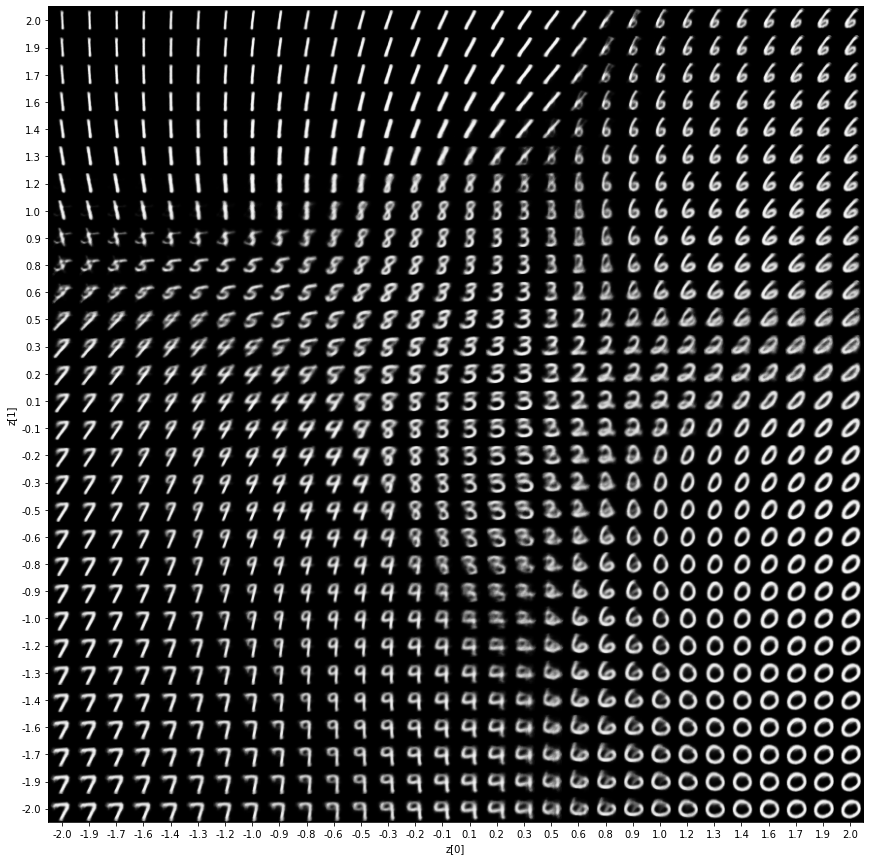

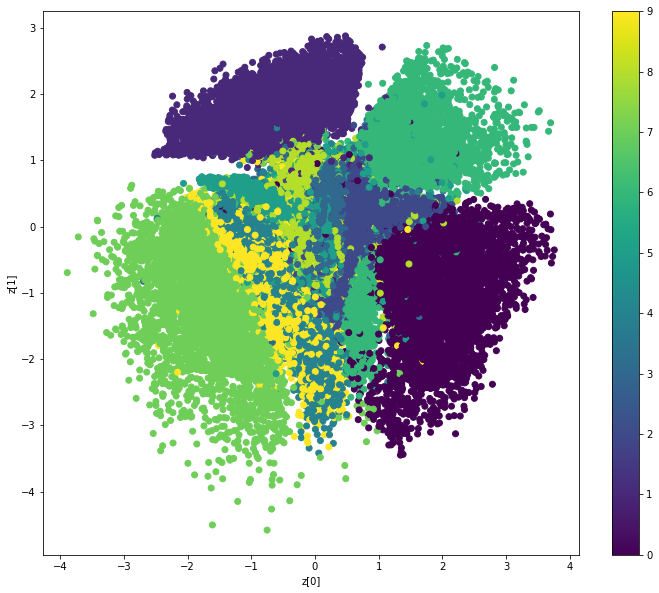

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 40


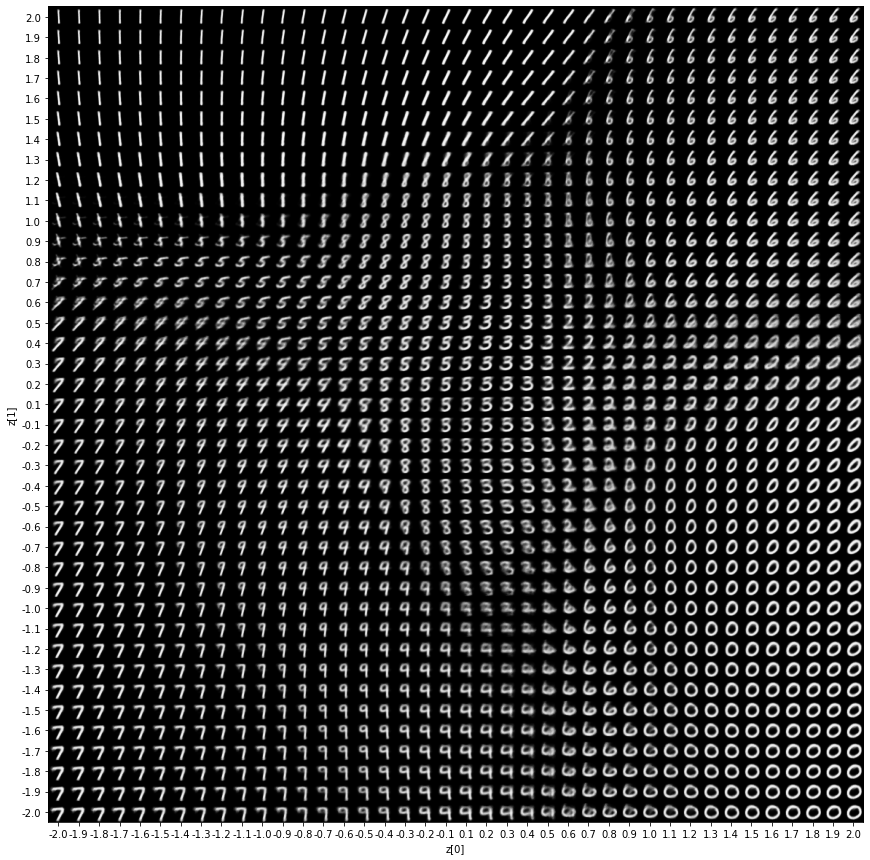

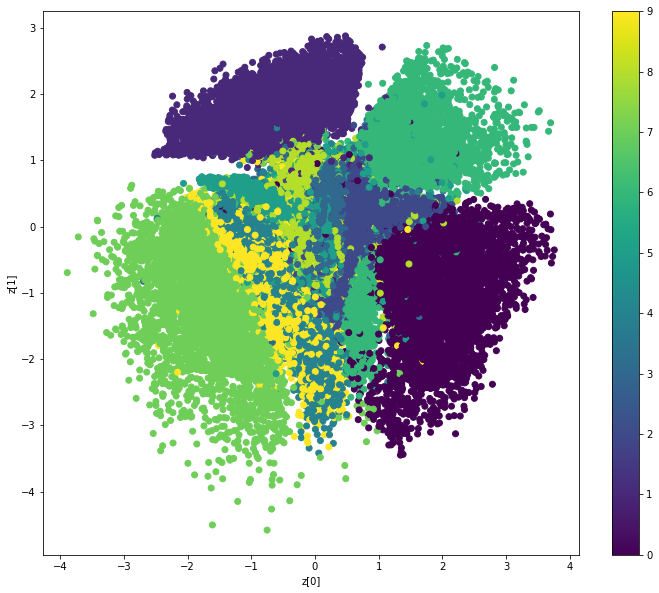

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 50


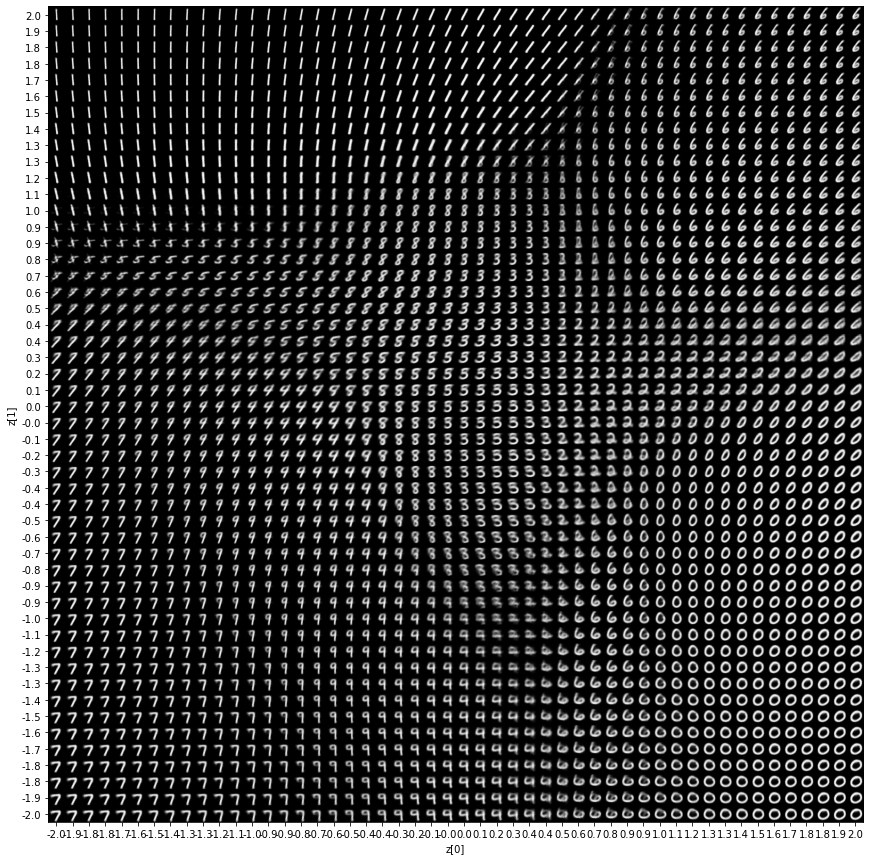

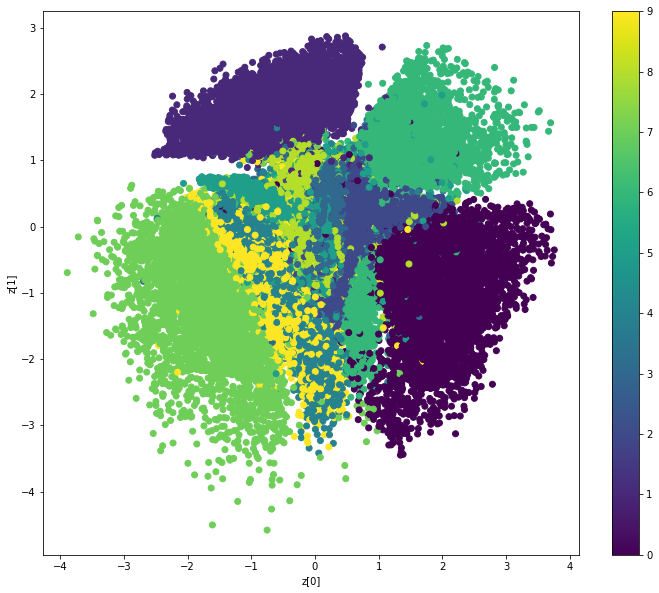

--------------------------------------------------------------------------------------------------------------------------------
Testing with scale: 2 and n: 60


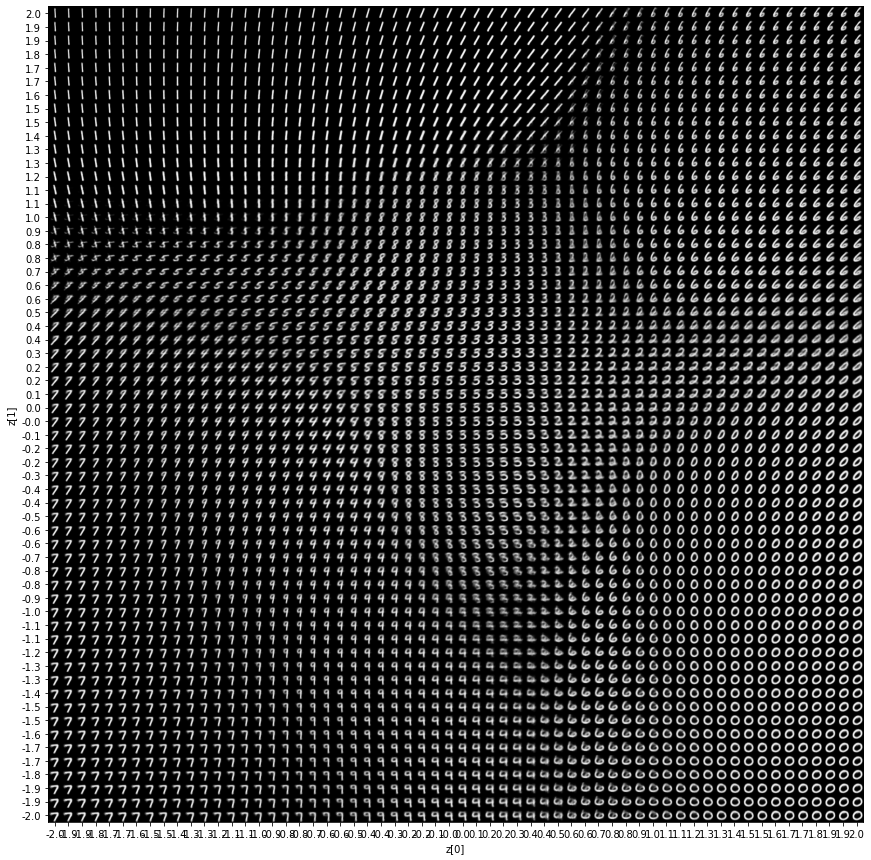

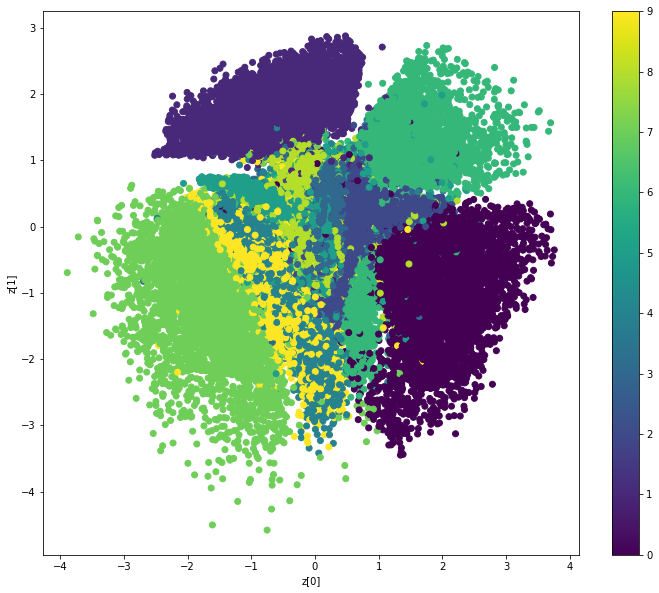

--------------------------------------------------------------------------------------------------------------------------------


In [ ]:
for n in [10,20,30,40,50,60]:
  print("Testing with scale: {} and n: {}".format(2,n))
  plot_latent(encoder, decoder, scale = 2, n = n, verbose = 0) 
  plot_label_clusters(encoder, decoder, x_train, y_train, verbose = 0)
  print("--------------------------------------------------------------------------------------------------------------------------------")